## Traspirazione - Prospero

Come detto precedentemente, l'evapotraspirazione è data dalla combinazione di due bilanci: evaporazione del suolo e traspirazione delle piante. 
Il modello in questione a differenza dei modelli analizzati fin'ora, 

Prospero permette di stimare la traspirazione a partire dal metodo di [Schymanski-Or](https://hess.copernicus.org/articles/21/685/2017/), in modo da includere nel bilancio la dipendenza dalla superficie traspirante e la conduttanza degli stomi. 

In questo modo si ottiene un sistema di quattro equazioni lineari, in funzione della temperatura delle foglie, tensione di vapore, calore sensibile e infine della traspirazione:

$$
\begin{equation}
   \begin{cases}
   T_{\Delta}=\frac{\gamma}{a_{sH}\ C_{Dr}\gamma+a_{sE}\ C_{Da}\Delta_{e{T}}}\cdot\frac{R_{s}-R_{ll}-S_{nk}}{\rho_{a} \bar u c_{p}}-\frac{C_{Da}}{a_{sH}\ C_{Dr}\gamma+a_{sE}\ C_{Da}\Delta_{e{T}}}\cdot \delta e(z)\\e_{\Delta}=\frac{\gamma\Delta_{e{T}}}{a_{sH}\ C_{Dr}\gamma+a_{sH}\ C_{Da}\Delta_{e{T}}}\cdot\frac{R_{s}-R_{ll}-S_{nk}}{\rho_{a} \bar u c_{p}}-\frac{a_{sH}\ C_{Dr}\gamma+(a_{sE}-1)\ C_{Da}\Delta_{e{T}}}{a_{sH}\ C_{Dr}\gamma+a_{sH}\ C_{Da}\Delta_{e{T}}}\cdot \delta e(z)\\H=\frac{C_{Dr}\gamma}{a_{sH} C_{Dr}\gamma+a_{sE}C_{Da}\Delta_{e{T}}}\cdot(R_{s}-R_{ll}-S_{nk})+\frac{\rho_{a}\bar u\ c_{p}\ C_{Dr}\ C_{Da}}{a_{sH}\ C_{Dr}\gamma+a_{sE}\ C_{Da}\Delta_{e{T}}}\cdot \delta e(z)\\\lambda E_{T}=\frac{C_{Da}\Delta_{e{T}}}{ C_{Dr}\gamma+a_{sE}C_{Da}\Delta_{e{T}}}\cdot(R_{s}-R_{ll}-S_{nk})+\frac{\rho_{a}\bar u\ c_{p}\ a_{sE}\ C_{Dr}\ C_{Da}\ +(a_{sE}-1)\ C_{Da}^2\Delta_{e{T}}\gamma^{-1} }{a_{sH}\ C_{Dr}\gamma+a_{sE}\ C_{Da}\Delta_{e{T}}}\cdot \delta e(z)
   \end{cases} 
\end{equation}
$$

Per ottenere l'evapotraspirazione effettiva, moltiplica l'evapotraspirazione potenziale a un fattore che riunisce gli stress $gs$ compreso tra 0 ed 1 che taglia linearmente l’evapotraspirazione. Proprio in questo Prospero si differenzia dagli altri metodi: tale prodotto avviene all'interno del sistema di equazioni, in modo da risolvere il bilancio energetico della foglia considerando la traspiraizone effettiva:
\begin{equation}
ET_{eff}=ET_{pot}\cdot g_{s}
\end{equation}

\begin{equation}
g_{s} = g_{s}max\cdot f(R_{par})\cdot f(T_{a})\cdot f(VPD) \cdot K_{s}
\end{equation}

where:
- $g_{s}max $: conduttanza degli stomi in condizioni ottimali di irrigazione e assenza di alcun tipo di stress; 
- $f(R_{par})$: coefficiente di stress, funzione della radiazione fotosinticamente attiva;
- $f(T_{a})$: coefficiente di stress, funzione della temperatura dell'aria;
- $f(VPD) $: coefficiente di stress, funzione del deficit della tensione di vapore;
- $K_{s} $:  coefficiente di stress, funzione del contenuto d'acqua.

In [3]:
import os
import warnings
import datetime
import warnings
import numpy as np
import pandas as pd
import xarray as xr
from matplotlib import rc
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.style as style
import matplotlib.dates as mdates
from IPython.display import Image
from GEOSPACE_Output import*
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)
oms_project_path = os.path.dirname(os.getcwd())
from IPython.display import Image

AttributeError: module 'pandas' has no attribute 'Panel'

In [2]:
os.chdir(os.path.join(os.getcwd(), "..", "OMS_GEOET11", "output", "Cavone", "1"))
#oms_project_path = os.path.dirname(os.getcwd())
#os.listdir()

Uno degli imput richiesti dal programma è quello di inserire una serie temporale per l'**indice di area fogliare: _LAI_**. 

Tale indice corrisponde a una quantità adimensionale che varia in base al tipo di vegetazione che abbiamo: nel caso delle latifoglie descrive la misura di superficie fogliare per unità di superficie del suolo; le conifere invece hanno bisogno di una diversa definizione perché non rappresenta l'effettiva superficie di scambio, in quanto sono caratterizzate da aghi a sezione circolare o semicircolare.  Per evitare il problema dovuto alla forma delle foglie, alcuni autori (Smith, 1991; Bolstad e Gower, 1990) proposero di modificare il parametro, introducendo l'area fogliare proiettata. ([Indice di Area Fogliare - Wikipedia](https://it.wikipedia.org/wiki/Indice_di_area_fogliare)).

## **Stima della Traspirazione  $[W m^{−2}]$**
Sono stati considerati tali condizioni:
- Traspirazione potenziale con LAI: Sia nel caso costante (pari a: 1) sia variabile (sinuisoidale)
- Stima della traspirazione da soli fattori ambientali, dal solo stress idrico ed effettiva (valutati con LAI sinuisoidale)
- Umidità del suolo: variabile (sinuisoidale)
- stazione: Cavone (1)
- Suolo: Silt loam (limo-argilloso)
- Coltura: conifere

### **Traspirazione potenziale**

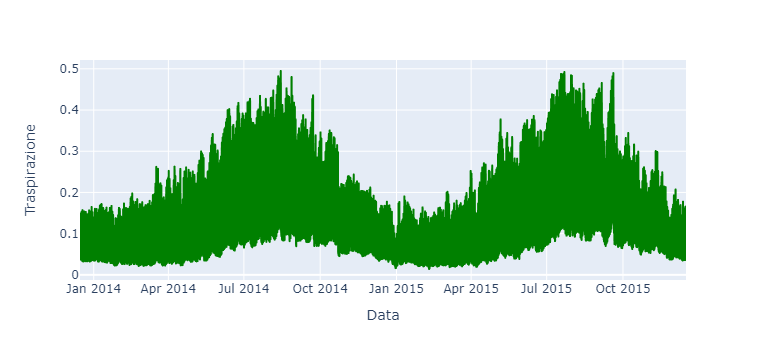

In [3]:
df = pd.read_csv('Transpiration_1_potential.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df.columns = ['Data','Traspirazione']
fig = px.line(df, x='Data', y='Traspirazione')
fig.update_traces(line_color='green')
fig.show()

Modificando il file inserito per l'indice LAI in una serie temporale sinuisoidale:

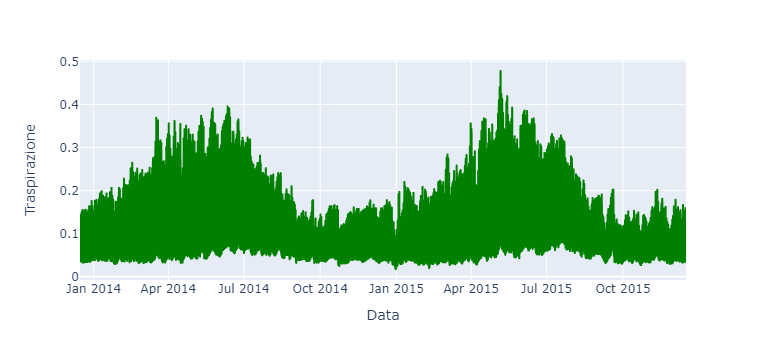

In [4]:
df2 = pd.read_csv('T_LAIsin_1_potential.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df2.columns = ['Data','Traspirazione']
fig = px.line(df2, x='Data', y='Traspirazione')
fig.update_traces(line_color='green')
fig.show()

Faccio un confronto tra i due risultati ottenuti:

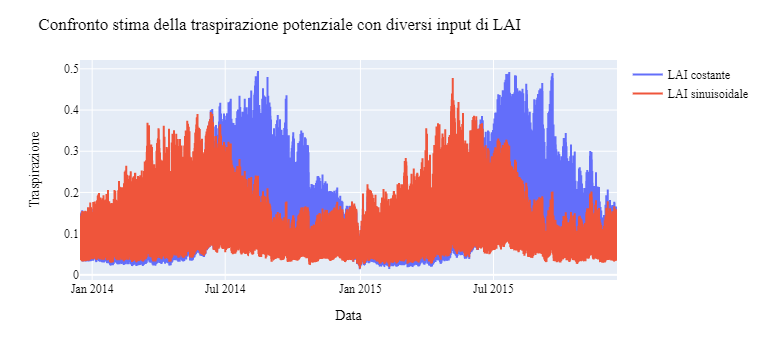

In [5]:
fig = px.line()
import plotly.graph_objects as go
fig.add_trace(go.Scatter(x=df['Data'], y=df['Traspirazione'], mode='lines', name='LAI costante'))
fig.add_trace(go.Scatter(x=df2['Data'], y=df2['Traspirazione'], mode='lines', name='LAI sinuisoidale'))

fig.update_layout(
    title='Confronto stima della traspirazione potenziale con diversi input di LAI',
    xaxis_title="Data",
    font_family="Times New Roman",
    font_color="Black",
    title_font_family="Times New Roman",
    title_font_color="Black",
    yaxis_title="Traspirazione",
    #legend_title="Date",
    font=dict(size=12))
fig.show()

I picchi corrispondenti agli stessi anni non coincidono: 
- per LAI = 1: 14 agosto 2014 + 22 luglio 2015
- LAI sin: 11 Giugno 2014 + 6 maggio 2015
Nel caso di una serie temporale sinuisoidale, il massimo valore della traspirazione anticipa di circa due mesi il rispettivo nella serie temporale costante.

I valori della traspirazione sono rispettivamente: 
- LAI=1: 0.49 in entrambi
- LAI=SIN: 0.39 nel 2014 e 0.48 nel 2015

I valori di minimo in entrambe le stime coincidono sia di giorno (31 dicembre 2014) che di valore: $0.07$.


### **Stima della Traspirazione con stress ambientali**

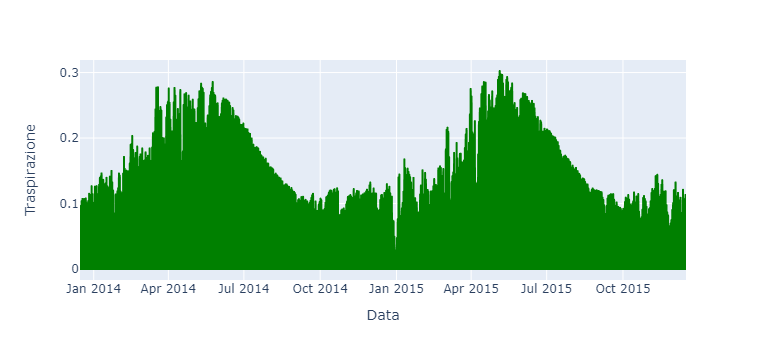

In [6]:
df3 = pd.read_csv('Transpiration_1_environmentalstress.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df3.columns = ['Data','Traspirazione']
fig = px.line(df3, x='Data', y='Traspirazione')
fig.update_traces(line_color='green')
fig.show()

### **Stima della Traspirazione con stress idrico** - LAI scorretto

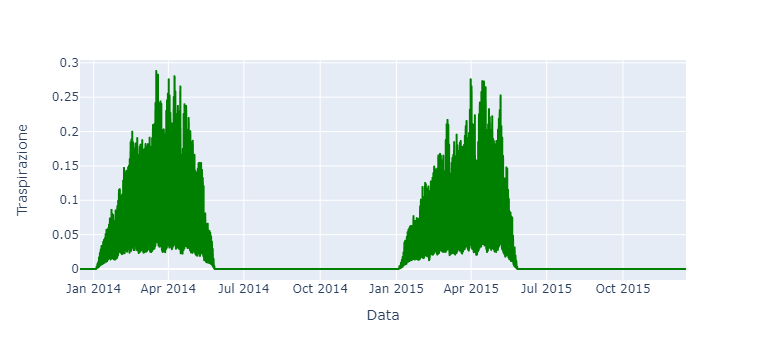

In [7]:
df4 = pd.read_csv('Transpiration_1_waterstress.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df4.columns = ['Data','Traspirazione']
fig = px.line(df4, x='Data', y='Traspirazione')
fig.update_traces(line_color='green')
fig.show()

Il risultato trovato inizialmente per la traspirazione con stress idrico rispecchia dei valori del parametro che definisce il Soil Moisture non adeguati: presentando infatti delle oscillazioni tra 0.05 e 0.2 vengono esclusi tutti i dati non compresi tra il Wilting Point (0.15) e la Field Capacity (0.29).

Il grafico sottostante mostra come gli unici valori che il programma considera in queste condizioni siano quelli compresi nella parte superiore alla retta rossa e sotto la sinusoide.


In [8]:
Image("/Users/titab/Desktop/Test_GEOframe_verona/OMS_Project_GEOET11/Images/GraficoProspero.jpg")

FileNotFoundError: No such file or directory: '/Users/titab/Desktop/Test_GEOframe_verona/OMS_Project_GEOET11/Images/GraficoProspero.jpg'

FileNotFoundError: No such file or directory: '/Users/titab/Desktop/Test_GEOframe_verona/OMS_Project_GEOET11/Images/GraficoProspero.jpg'

<IPython.core.display.Image object>

Nel caso di SoilMoisture18 cambia mentre se LAI_all1 resta uguale

## Ripeto operazione con Soil Moisture e LAI corretto

Per trovare un risultato migliore è necessario ripetere la simulazione, cambiando il valore del Soil Moisture e imponendo ad esempio oscillazioni tra il valore di Wilting Point e quello di Field Capacity. I risultati che si ottengono in questo caso, dopo aver calcolato anche l'andamento del LAI, caratterizzato da un andamento sinusoidale tra 5 e 10 (valore tipico per le conifere), vengono esposti in seguito:

In [9]:
df8 = pd.read_csv('Con_Transpiration_1_potential.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df8.columns = ['Data','Traspirazione']
fig = px.line(df8, x='Data', y='Traspirazione')
fig.update_traces(line_color='green')
fig.show()

FileNotFoundError: [Errno 2] No such file or directory: 'Con_Transpiration_1_potential.csv'

In [ ]:
df9 = pd.read_csv('Con_Transpiration_1_environmentalstress.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df9.columns = ['Data','Traspirazione']
fig = px.line(df9, x='Data', y='Traspirazione')
fig.update_traces(line_color='green')
fig.show()

In [ ]:
df10 = pd.read_csv('Con_Transpiration_1_waterstress.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df10.columns = ['Data','Traspirazione']
fig = px.line(df10, x='Data', y='Traspirazione')
fig.update_traces(line_color='green')
fig.show()

In [ ]:
df11 = pd.read_csv('Con_Transpiration_1_totalstress.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df11.columns = ['Data','Traspirazione']
fig = px.line(df11, x='Data', y='Traspirazione')
fig.update_traces(line_color='green')
fig.show()

In [ ]:
fig = px.line()
fig.add_trace(go.Scatter(x=df8['Data'], y=df8['Traspirazione'], mode='lines', name='Traspirazione Potenziale'))
fig.add_trace(go.Scatter(x=df9['Data'], y=df9['Traspirazione'], mode='lines', name='T Ambientale'))
fig.add_trace(go.Scatter(x=df10['Data'], y=df10['Traspirazione'], mode='lines', name='T Stress Idrico'))
fig.add_trace(go.Scatter(x=df11['Data'], y=df11['Traspirazione'], mode='lines', name='Traspirazione Effettiva'))

fig.update_layout(
    title='Diverse Traspirazioni per una Conifera - Prospero',
    xaxis_title="Data",
    font_family="Times New Roman",
    font_color="Black",
    title_font_family="Times New Roman",
    title_font_color="Black",
    yaxis_title="Traspirazione [mm]",
    #legend_title="Date",
    font=dict(size=12))
fig.show()

La traspirazione, soprattutto tenendo conto dello stress idrico, risente in questo caso molto dell'andamento stagionale: si trovano infatti dei massimi molto marcati nei mesi estivi e dei minimi in ottobre.

**traspirazione effettiva ha un andamento molto simile a stress idrico**

## Confronto temperatura fogliare - Traspirazione effettiva
### Temperatura Foglie al sole

In [ ]:
df0 = pd.read_csv('LT_Sun_1_totalstress.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df0.columns = ['Data','LeafTemperature']
fig = px.line(df0, x='Data', y='LeafTemperature', title='Leaf Temperature Sun [K]')
fig.update_traces(line_color='green')
fig.show()

### Temperatura foglie in ombra

In [ ]:
df1 = pd.read_csv('LT_Shade_1_totalstress.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])

df1.columns = ['Data','LeafTemperature']
fig = px.line(df1, x='Data', y='LeafTemperature', title='Leaf Temperature Shadow [K]')
fig.update_traces(line_color='green')
fig.show()

In [ ]:
fig = px.line()
fig.add_trace(go.Scatter(x=df0['Data'], y=df0['LeafTemperature'], mode='lines', name='Temperatura foglie al sole'))
fig.add_trace(go.Scatter(x=df1['Data'], y=df1['LeafTemperature'], mode='lines', name='Temperatura foglie in ombra'))


fig.update_layout(
    title='Confronto diverse stime della Traspirazione - Prospero',
    xaxis_title="Data",
    font_family="Times New Roman",
    font_color="Black",
    title_font_family="Times New Roman",
    title_font_color="Black",
    yaxis_title="Temperatura [K]",
    #legend_title="Date",
    font=dict(size=12))
fig.show()

**mettere solo l'ultimo grafico di confronto**

# Traspirazione effettiva - melo

In [ ]:
df = pd.read_csv('Melo_Transpiration_1_totalstress.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df.columns = ['Data','Traspirazione Melo']
fig = px.line(df, x='Data', y='Traspirazione Melo')
fig.update_traces(line_color='green')
fig.show()

# confronto T effettiva melo - conifere